In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/Research/good.csv')
print(df.head())
df

   Time (s)  F0 (V)  F1 (V)  F2 (V)  F3 (V)  F4 (V)  F5 (V)  F6 (V)  F7 (V)
0      1.51    0.50    0.50    0.56    0.50    0.51    0.50    0.50    0.50
1      1.63    0.49    0.50    0.56    0.50    0.51    0.49    0.49    0.50
2      1.76    0.49    0.49    0.55    0.50    0.51    0.49    0.50    0.50
3      1.88    0.50    0.50    0.56    0.50    0.50    0.49    0.48    0.49
4      2.01    0.50    0.50    0.56    0.49    0.51    0.50    0.50    0.49


,Time (s),F0 (V),F1 (V),F2 (V),F3 (V),F4 (V),F5 (V),F6 (V),F7 (V)
0,1.51,0.50,0.50,0.56,0.50,0.51,0.50,0.50,0.50
1,1.63,0.49,0.50,0.56,0.50,0.51,0.49,0.49,0.50
2,1.76,0.49,0.49,0.55,0.50,0.51,0.49,0.50,0.50
3,1.88,0.50,0.50,0.56,0.50,0.50,0.49,0.48,0.49
4,2.01,0.50,0.50,0.56,0.49,0.51,0.50,0.50,0.49
...,...,...,...,...,...,...,...,...,...
5877,736.13,0.49,0.49,0.58,0.49,0.52,0.49,0.50,0.49
5878,736.26,0.50,0.49,0.58,0.49,0.52,0.50,0.50,0.49
5879,736.38,0.50,0.50,0.58,0.49,0.52,0.49,0.50,0.50
5880,736.51,0.50,0.50,0.58,0.48,0.52,0.49,0.50,0.49


# Data Preprocessing

In [ ]:
def min_max_scale(df, global_min, global_max, exclude_cols=[]):
    scaled_df = df.copy()
    for col in df.columns:
        if col not in exclude_cols:
            scaled_df[col] = (df[col] - global_min) / (global_max - global_min)
    return scaled_df

In [ ]:
GLOBAL_MIN = 0.45
GLOBAL_MAX = 2.2

def create_rp(exclude_cols, baseline, file_path):
  label = ''

  if file_path.endswith('.csv'):
    df = pd.read_csv(file_path)
    if 'good' in file_path:
        df['Label'] = 'good'
        label = 'good'
    elif 'bad' in file_path:
      if 'left' in file_path:
        df['Label'] = 'bad_left'
        label = 'bad_left'
      elif 'right' in file_path:
        df['Label'] = 'bad_right'
        label = 'bad_right'
      elif 'front' in file_path:
        df['Label'] = 'bad_front'
        label = 'bad_front'
      elif 'back' in file_path:
        df['Label'] = 'bad_back'
        label = 'bad_back'
      else:
        df['Label'] = 'bad'
        label = 'bad'
        print("this is file_name:", file_path)
    else:
        df['Label'] = 'unknown'  # ?
        label = 'unknown'
    #df is the dataframe from the csv file

    # Find the index of the first row where any sensor value exceeds the baseline
    baseline_idx = df[(df[['F0 (V)', 'F1 (V)', 'F2 (V)', 'F3 (V)', 'F4 (V)', 'F5 (V)', 'F6 (V)', 'F7 (V)']] > baseline).any(axis=1)].index[0]

    # Slice the DataFrame from that index onward
    final_df = df.loc[baseline_idx:].reset_index(drop=True)

    # min max scaling
    final_df = min_max_scale(final_df, GLOBAL_MIN, GLOBAL_MAX, exclude_cols)

    return final_df

In [ ]:
good_rp_df = create_rp(exclude_cols = ['Time (s)', 'Label'], baseline = 0.6, file_path = '/content/drive/MyDrive/Research/good.csv')
good_rp_df

,Time (s),F0 (V),F1 (V),F2 (V),F3 (V),F4 (V),F5 (V),F6 (V),F7 (V),Label
0,20.63,0.034286,0.028571,0.091429,0.022857,0.040000,0.028571,0.034286,0.028571,good
1,20.76,0.034286,0.017143,0.091429,0.022857,0.034286,0.022857,0.028571,0.022857,good
2,20.88,0.034286,0.022857,0.091429,0.022857,0.045714,0.028571,0.034286,0.028571,good
3,21.01,0.034286,0.028571,0.097143,0.028571,0.040000,0.028571,0.034286,0.028571,good
4,21.13,0.034286,0.022857,0.102857,0.028571,0.045714,0.034286,0.034286,0.028571,good
...,...,...,...,...,...,...,...,...,...,...
5724,736.13,0.022857,0.022857,0.074286,0.022857,0.040000,0.022857,0.028571,0.022857,good
5725,736.26,0.028571,0.022857,0.074286,0.022857,0.040000,0.028571,0.028571,0.022857,good
5726,736.38,0.028571,0.028571,0.074286,0.022857,0.040000,0.022857,0.028571,0.028571,good
5727,736.51,0.028571,0.028571,0.074286,0.017143,0.040000,0.022857,0.028571,0.022857,good


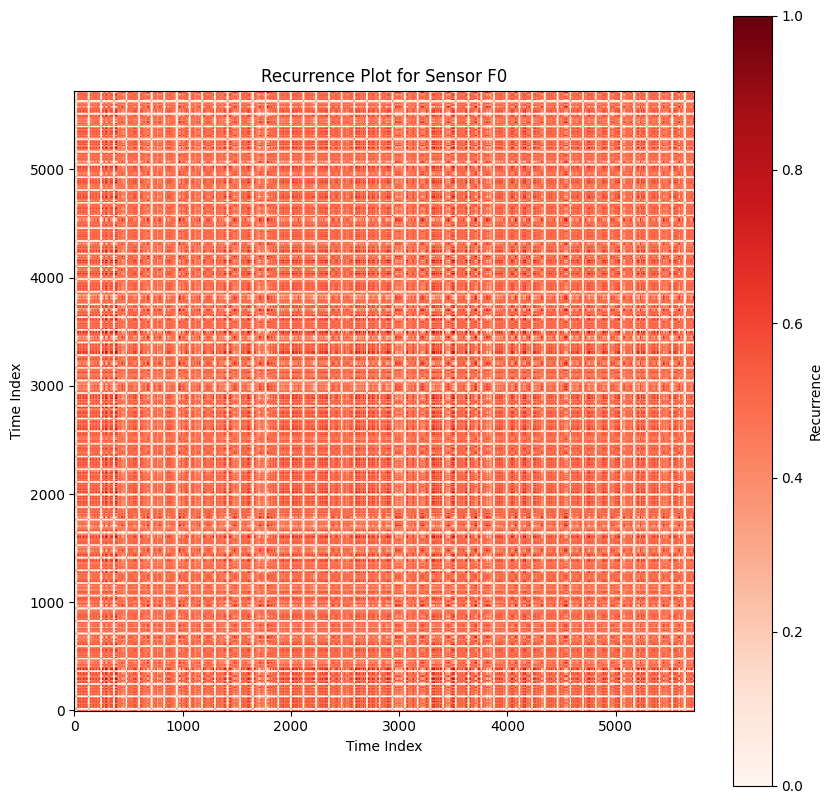

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform, cdist

# Extract the data for sensor F0
sensor_data = good_rp_df['F7 (V)'].values

threshold = 0.001  # This may need to be adjusted


distances = cdist(sensor_data.reshape(-1, 1), sensor_data.reshape(-1, 1), metric='euclidean')

# Apply threshold to create the recurrence matrix
recurrence_matrix = np.where(distances < threshold, 1, 0)

# Step 4: Plot the recurrence plot
plt.figure(figsize=(10, 10))
plt.imshow(recurrence_matrix, cmap='Reds', origin='lower')
plt.title('Recurrence Plot for Sensor F0')
plt.xlabel('Time Index')
plt.ylabel('Time Index')
plt.colorbar(label='Recurrence')
plt.show()



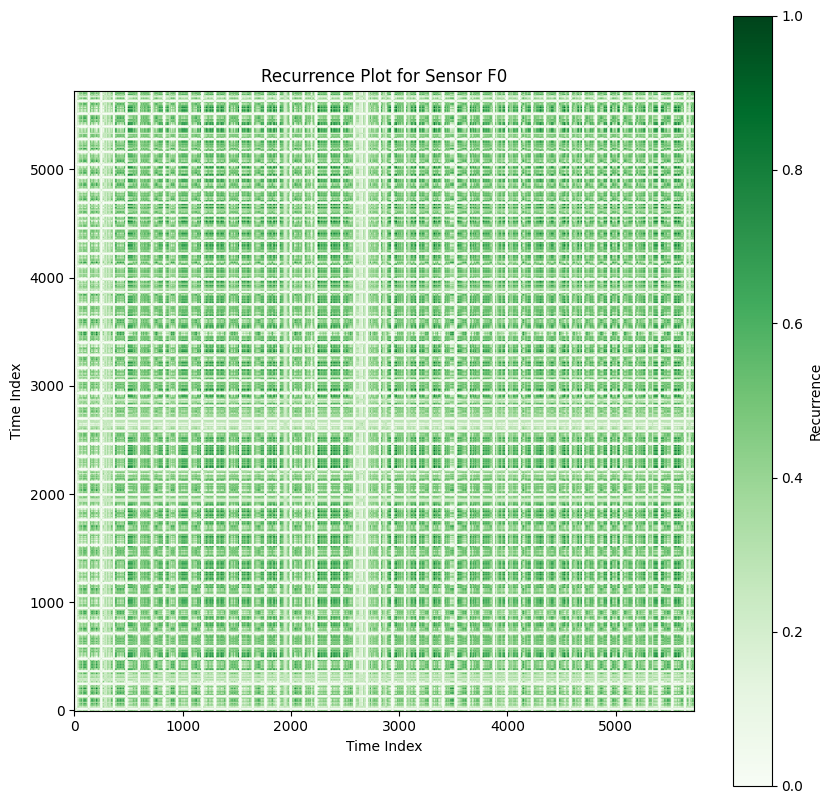

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform, cdist

# Extract the data for sensor F0
sensor_data = good_rp_df['F5 (V)'].values

threshold = 0.001  # This may need to be adjusted


distances = cdist(sensor_data.reshape(-1, 1), sensor_data.reshape(-1, 1), metric='euclidean')

# Apply threshold to create the recurrence matrix
recurrence_matrix1 = np.where(distances < threshold, 1, 0)

# Step 4: Plot the recurrence plot
plt.figure(figsize=(10, 10))
plt.imshow(recurrence_matrix1, cmap='Greens', origin='lower')
plt.title('Recurrence Plot for Sensor F0')
plt.xlabel('Time Index')
plt.ylabel('Time Index')
plt.colorbar(label='Recurrence')
plt.show()



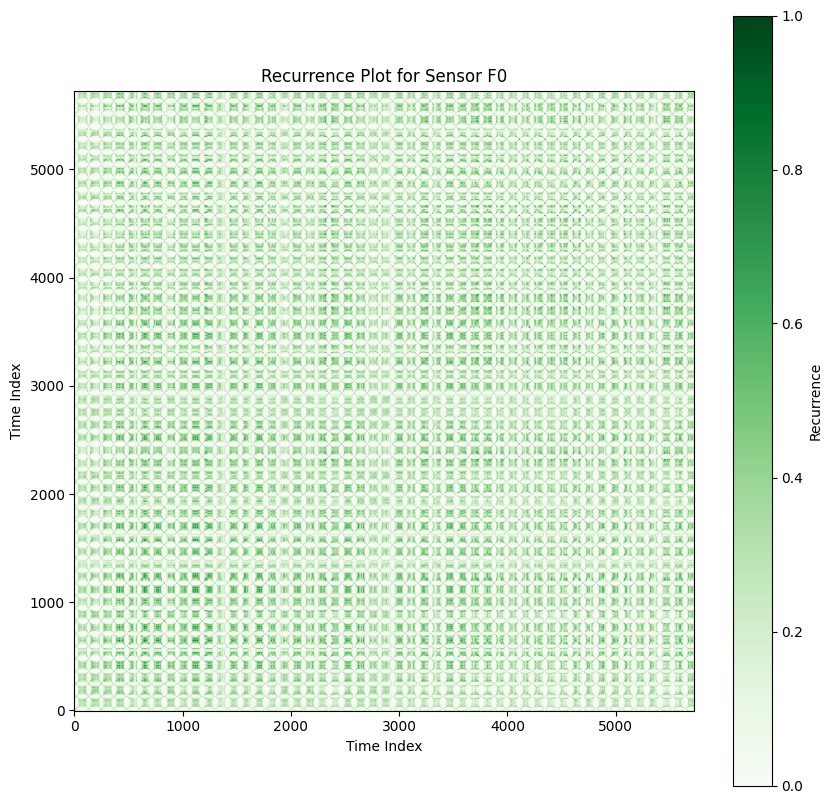

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform, cdist

# Extract the data for sensor F0
sensor_data = good_rp_df['F4 (V)'].values

threshold = 0.001  # This may need to be adjusted


distances = cdist(sensor_data.reshape(-1, 1), sensor_data.reshape(-1, 1), metric='euclidean')

# Apply threshold to create the recurrence matrix
recurrence_matrix2 = np.where(distances < threshold, 1, 0)

# Step 4: Plot the recurrence plot
plt.figure(figsize=(10, 10))
plt.imshow(recurrence_matrix2, cmap='Greens', origin='lower')
plt.title('Recurrence Plot for Sensor F0')
plt.xlabel('Time Index')
plt.ylabel('Time Index')
plt.colorbar(label='Recurrence')
plt.show()



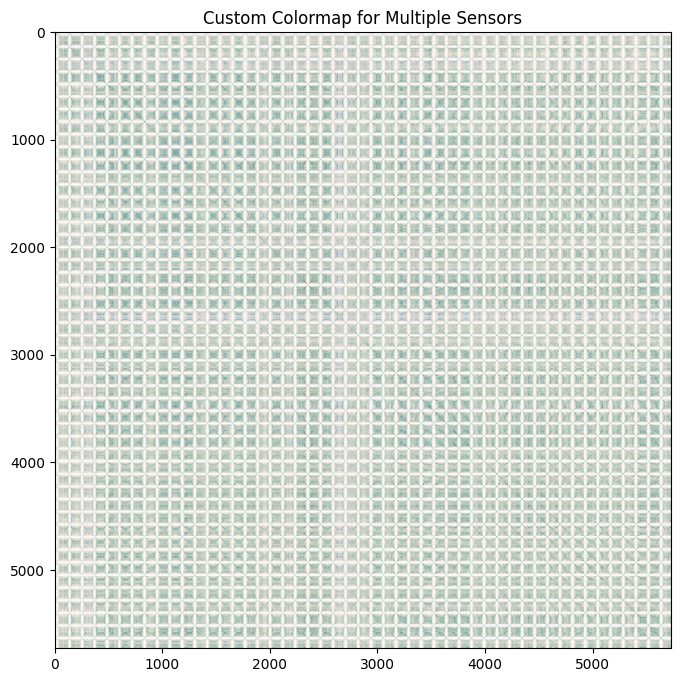

In [ ]:
import matplotlib.pyplot as plt

# Plot recurrence plots for 8 sensors using distinct color maps
fig, ax = plt.subplots(figsize=(8, 8))

# Overlay the plots with different color maps and alpha values
ax.imshow(recurrence_matrix, cmap='Reds', alpha=0.5)
ax.imshow(recurrence_matrix1, cmap='Greens', alpha=0.5)
ax.imshow(recurrence_matrix2, cmap='Blues', alpha=0.5)


plt.title("Custom Colormap for Multiple Sensors")
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Plot recurrence plots for 8 sensors using distinct color maps
fig, ax = plt.subplots(figsize=(8, 8))

# Overlay the plots with different color maps and alpha values
ax.imshow(rp_1, cmap='Reds', alpha=0.5)
ax.imshow(rp_2, cmap='Greens', alpha=0.5)
ax.imshow(rp_3, cmap='Blues', alpha=0.5)
ax.imshow(rp_4, cmap='Purples', alpha=0.5)
ax.imshow(rp_5, cmap='Oranges', alpha=0.5)
ax.imshow(rp_6, cmap='Greys', alpha=0.5)
ax.imshow(rp_7, cmap='YlGn', alpha=0.5)  # Yellow-Green
ax.imshow(rp_8, cmap='PiYG', alpha=0.5)  # Pink-Green

plt.title("Custom Colormap for Multiple Sensors")
plt.show()


# Recurrence Plot for Good Data (from good.csv)

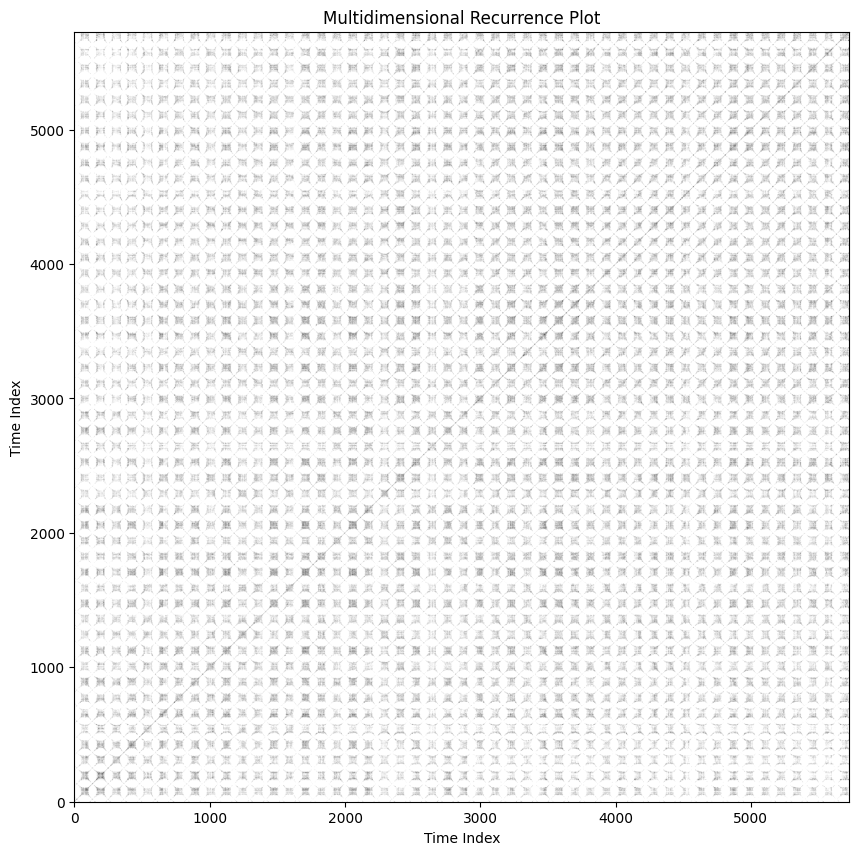

In [ ]:
sensor_data = good_rp_df.iloc[:, 1:9].values  # Assuming columns F0 to F7 are at positions 1 to 8

# Compute the pairwise distances between multidimensional points
distance_matrix = squareform(pdist(sensor_data, 'euclidean'))

# Define a threshold (epsilon)
epsilon = np.percentile(distance_matrix, 5)  # Set threshold to 5th percentile of distances

# Create the recurrence matrix
recurrence_matrix = (distance_matrix < epsilon).astype(float)

# Plot the recurrence plot
plt.figure(figsize=(10, 10))
plt.imshow(recurrence_matrix, cmap='binary', origin='lower', aspect='auto')
plt.title('Multidimensional Recurrence Plot')
plt.xlabel('Time Index')
plt.ylabel('Time Index')
plt.show()

#

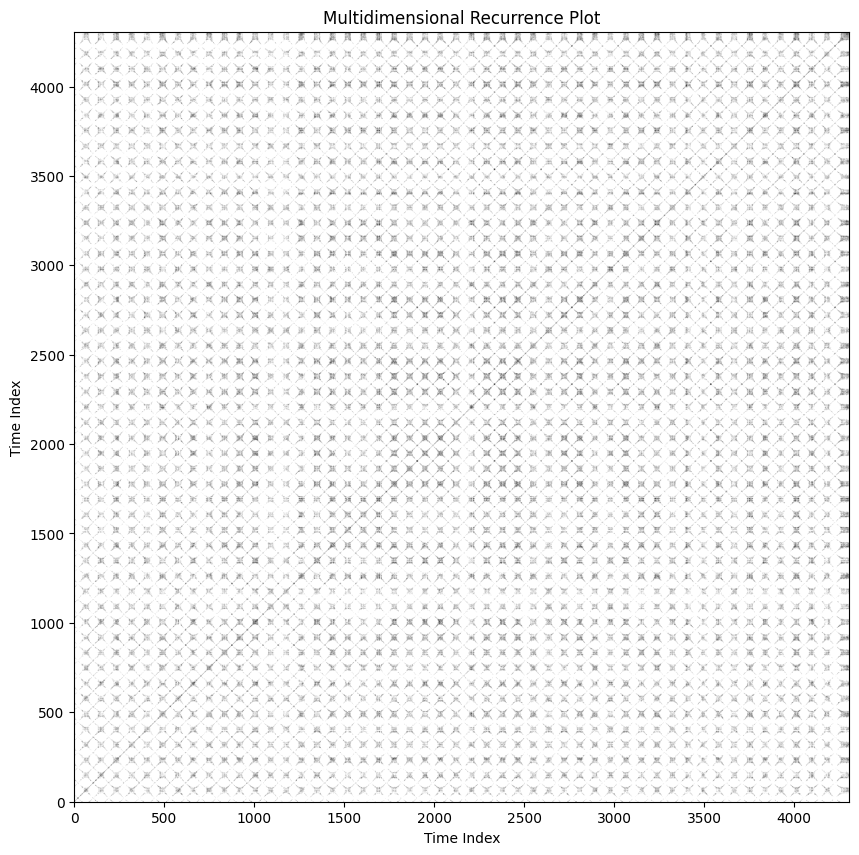

In [ ]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform
import matplotlib.pyplot as plt

good1_rp_df = create_rp(exclude_cols = ['Time (s)', 'Label'], baseline = 0.6, file_path = '/content/drive/MyDrive/Research/good2.csv')

sensor_data = good1_rp_df.iloc[:, 1:9].values  # Assuming columns F0 to F7 are at positions 1 to 8

# Compute the pairwise distances between multidimensional points
distance_matrix = squareform(pdist(sensor_data, 'euclidean'))

# Define a threshold (epsilon)
epsilon = np.percentile(distance_matrix, 5)  # Set threshold to 5th percentile of distances

# Create the recurrence matrix
recurrence_matrix = (distance_matrix < epsilon).astype(float)

# Plot the recurrence plot
plt.figure(figsize=(10, 10))
plt.imshow(recurrence_matrix, cmap='binary', origin='lower', aspect='auto')
plt.title('Multidimensional Recurrence Plot')
plt.xlabel('Time Index')
plt.ylabel('Time Index')
plt.show()

# Recurrence Plot for Bad Back (from bad_big_circle_back_redo.csv)

In [ ]:
bad_back_rp_df = create_rp(exclude_cols = ['Time (s)', 'Label'], baseline = 0.6, file_path = '/content/drive/MyDrive/Research/bad_big_circle_back_redo.csv')
bad_back_rp_df

,Time (s),F0 (V),F1 (V),F2 (V),F3 (V),F4 (V),F5 (V),F6 (V),F7 (V),Label
0,22.25,0.028571,0.022857,0.057143,0.028571,0.091429,0.022857,0.022857,0.022857,bad_back
1,22.38,0.022857,0.028571,0.062857,0.034286,0.091429,0.022857,0.028571,0.022857,bad_back
2,22.50,0.028571,0.028571,0.062857,0.034286,0.085714,0.028571,0.028571,0.022857,bad_back
3,22.63,0.028571,0.028571,0.062857,0.034286,0.091429,0.028571,0.028571,0.028571,bad_back
4,22.75,0.028571,0.028571,0.068571,0.028571,0.097143,0.028571,0.028571,0.028571,bad_back
...,...,...,...,...,...,...,...,...,...,...
10848,1378.25,0.028571,0.022857,0.022857,0.022857,0.028571,0.022857,0.022857,0.028571,bad_back
10849,1378.38,0.028571,0.028571,0.028571,0.022857,0.028571,0.022857,0.028571,0.028571,bad_back
10850,1378.50,0.028571,0.028571,0.028571,0.022857,0.022857,0.022857,0.022857,0.028571,bad_back
10851,1378.63,0.022857,0.028571,0.028571,0.022857,0.034286,0.028571,0.028571,0.022857,bad_back


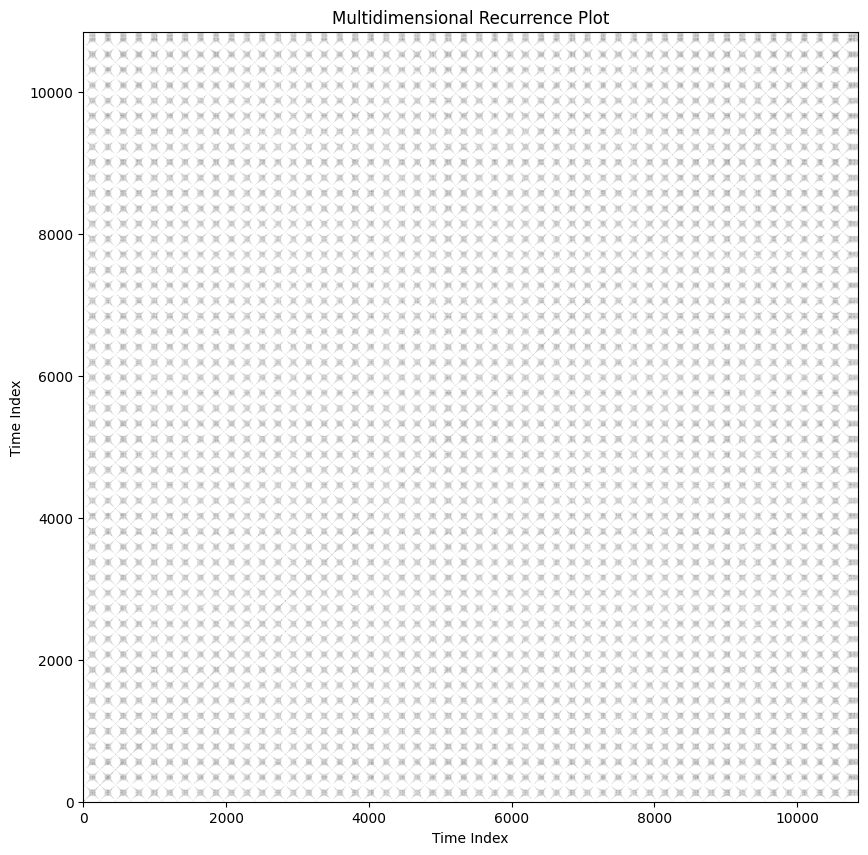

In [ ]:
sensor_data = bad_back_rp_df.iloc[:, 1:9].values  # Assuming columns F0 to F7 are at positions 1 to 8

# Compute the pairwise distances between multidimensional points
distance_matrix = squareform(pdist(sensor_data, 'euclidean'))

# Define a threshold (epsilon)
epsilon = np.percentile(distance_matrix, 5)  # Set threshold to 5th percentile of distances

# Create the recurrence matrix
recurrence_matrix = (distance_matrix < epsilon).astype(float)

# Plot the recurrence plot
plt.figure(figsize=(10, 10))
plt.imshow(recurrence_matrix, cmap='binary', origin='lower', aspect='auto')
plt.title('Multidimensional Recurrence Plot')
plt.xlabel('Time Index')
plt.ylabel('Time Index')
plt.show()

# Recurrence Plot for Bad Front (from bad_big_circle_front.csv)

In [ ]:
bad_front_rp_df = create_rp(exclude_cols = ['Time (s)', 'Label'], baseline = 0.6, file_path = '/content/drive/MyDrive/Research/bad_big_circle_front.csv')

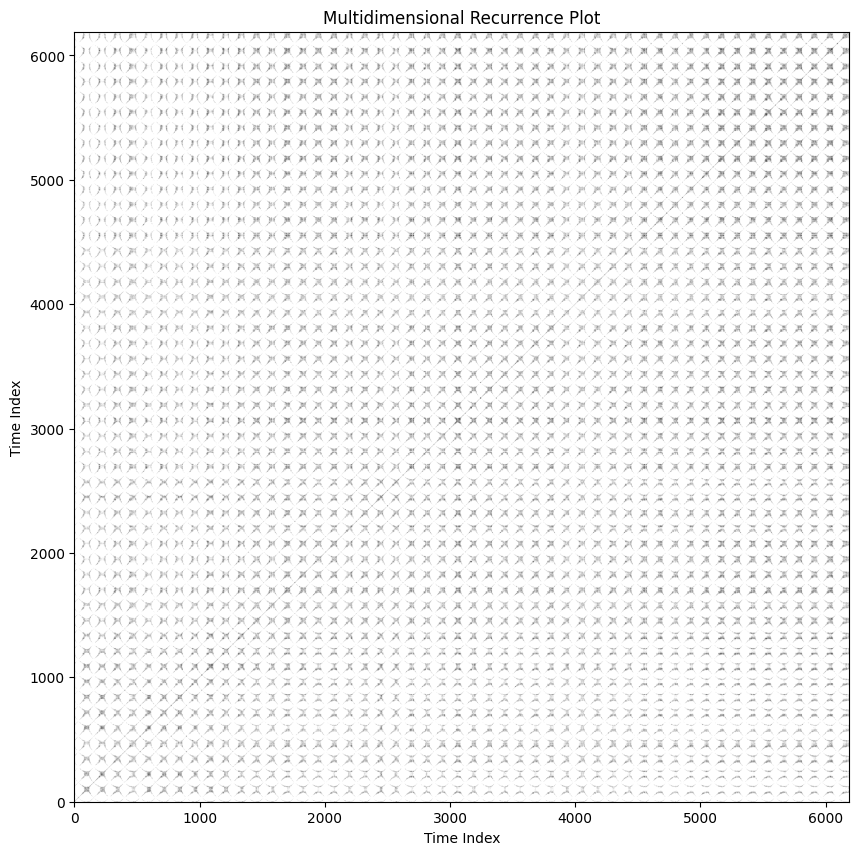

In [ ]:
sensor_data = bad_front_rp_df.iloc[:, 1:9].values  # Assuming columns F0 to F7 are at positions 1 to 8

# Compute the pairwise distances between multidimensional points
distance_matrix = squareform(pdist(sensor_data, 'euclidean'))

# Define a threshold (epsilon)
epsilon = np.percentile(distance_matrix, 5)  # Set threshold to 5th percentile of distances

# Create the recurrence matrix
recurrence_matrix = (distance_matrix < epsilon).astype(float)

# Plot the recurrence plot
plt.figure(figsize=(10, 10))
plt.imshow(recurrence_matrix, cmap='binary', origin='lower', aspect='auto')
plt.title('Multidimensional Recurrence Plot')
plt.xlabel('Time Index')
plt.ylabel('Time Index')
plt.show()

# Recurrence Plot for Bad Left (from bad_big_circle_left.csv)

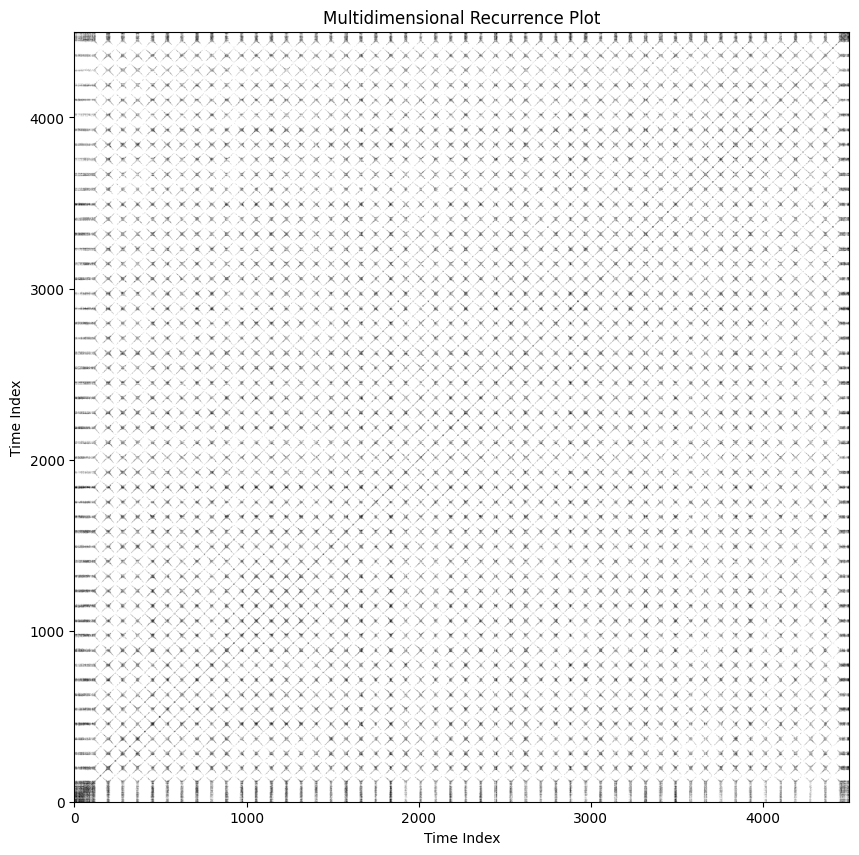

In [ ]:
bad_left_rp_df = create_rp(exclude_cols = ['Time (s)', 'Label'], baseline = 0.6, file_path = '/content/drive/MyDrive/Research/bad_big_circle_left.csv')

sensor_data = bad_left_rp_df.iloc[:, 1:9].values

# Compute the pairwise distances between multidimensional points
distance_matrix = squareform(pdist(sensor_data, 'euclidean'))

# Define a threshold (epsilon)
epsilon = np.percentile(distance_matrix, 5)  # Set threshold to 5th percentile of distances

# Create the recurrence matrix
recurrence_matrix = (distance_matrix < epsilon).astype(float)

# Plot the recurrence plot
plt.figure(figsize=(10, 10))
plt.imshow(recurrence_matrix, cmap='binary', origin='lower', aspect='auto')
plt.title('Multidimensional Recurrence Plot')
plt.xlabel('Time Index')
plt.ylabel('Time Index')
plt.show()

In [ ]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform
import matplotlib.pyplot as plt


bad_left_rp_df = create_rp(exclude_cols = ['Time (s)', 'Label'], baseline = 0.6, file_path = '/content/drive/MyDrive/Research/bad_big_circle_left.csv')

sensor_data = bad_left_rp_df.iloc[:, 1:9].values

# window size
window_size = 500

# Iterate over the data with a sliding window
for start_idx in range(0, sensor_data.shape[0] - window_size + 1, window_size):
    # Select a window of the data
    window_data = sensor_data[start_idx:start_idx + window_size]

    # Compute the euclidean distances for the window
    distance_matrix = squareform(pdist(window_data, 'euclidean'))

    # 5th percentile of distances
    epsilon = np.percentile(distance_matrix, 5)

    # Create the recurrence matrix for the window
    recurrence_matrix = (distance_matrix < epsilon).astype(float)

    # Plot the recurrence plot
    plt.figure(figsize=(10, 10))
    plt.imshow(recurrence_matrix, cmap='binary', origin='lower', aspect='auto')
    plt.title(f'Multidimensional Recurrence Plot - Window {start_idx} to {start_idx + window_size}')
    plt.xlabel('Time Index')
    plt.ylabel('Time Index')
    plt.show()


Output hidden; open in https://colab.research.google.com to view.

# Recurrence Plot for Bad Right (from bad_big_circle_right.csv)

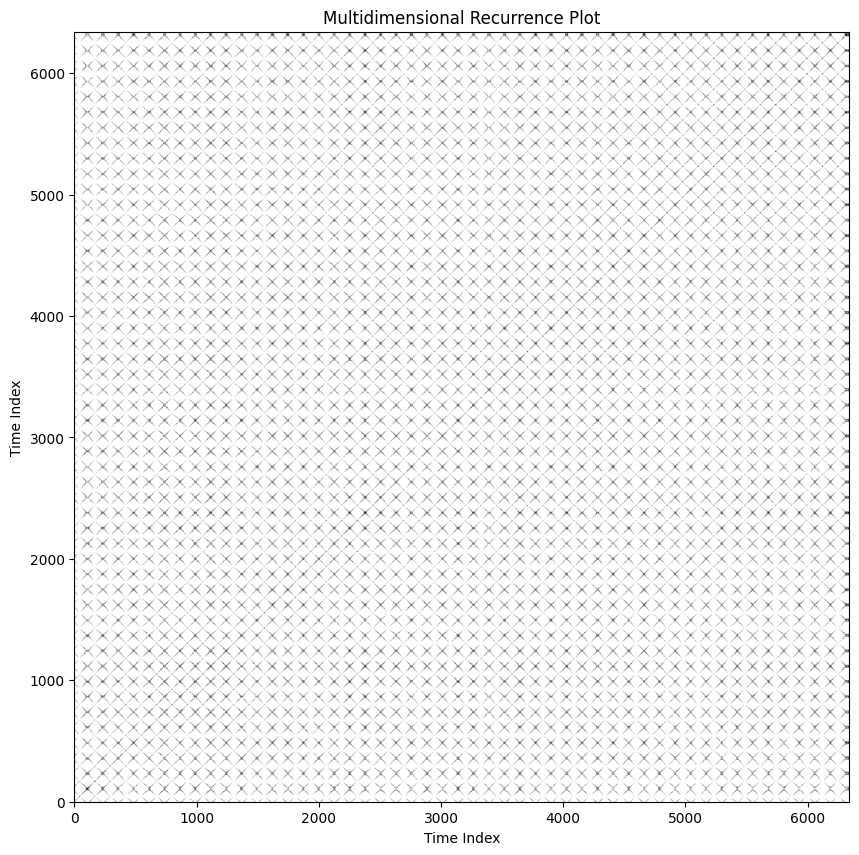

In [ ]:
bad_right_rp_df = create_rp(exclude_cols = ['Time (s)', 'Label'], baseline = 0.6, file_path = '/content/drive/MyDrive/Research/bad_big_circle_right.csv')

sensor_data = bad_right_rp_df.iloc[:, 1:9].values  # Assuming columns F0 to F7 are at positions 1 to 8

# Compute the pairwise distances between multidimensional points
distance_matrix = squareform(pdist(sensor_data, 'euclidean'))

# Define a threshold (epsilon)
epsilon = np.percentile(distance_matrix, 5)  # Set threshold to 5th percentile of distances

# Create the recurrence matrix
recurrence_matrix = (distance_matrix < epsilon).astype(float)

# Plot the recurrence plot
plt.figure(figsize=(10, 10))
plt.imshow(recurrence_matrix, cmap='binary', origin='lower', aspect='auto')
plt.title('Multidimensional Recurrence Plot')
plt.xlabel('Time Index')
plt.ylabel('Time Index')
plt.show()

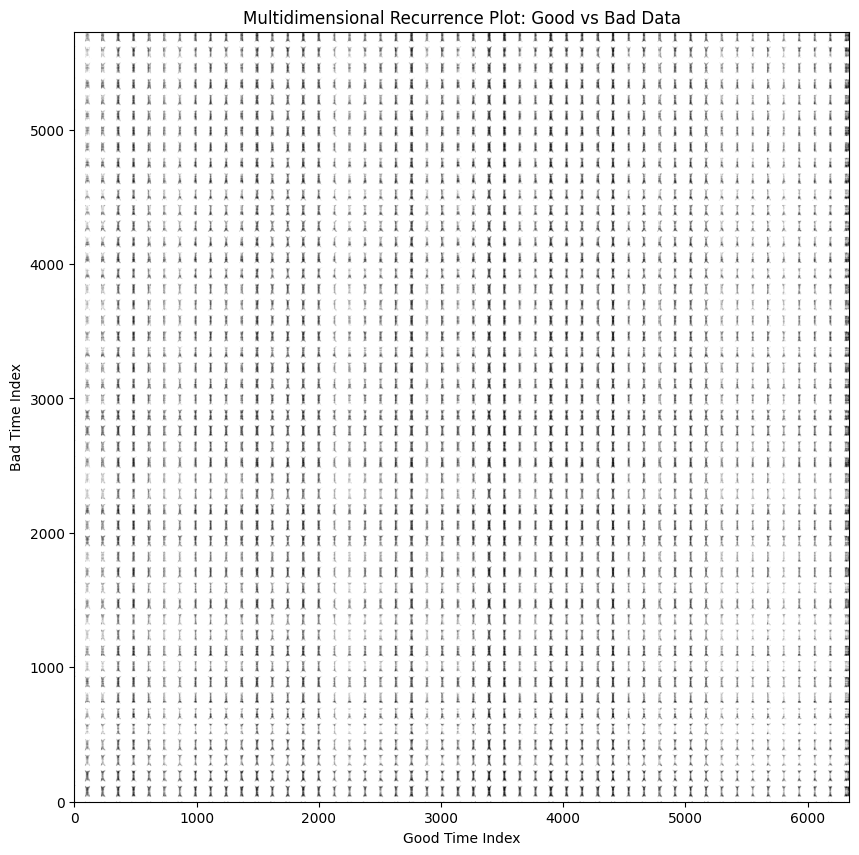

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

bad_right_rp_df = create_rp(exclude_cols = ['Time (s)', 'Label'], baseline = 0.6, file_path = '/content/drive/MyDrive/Research/bad_big_circle_right.csv')
good_df = create_rp(exclude_cols = ['Time (s)', 'Label'], baseline = 0.6, file_path = '/content/drive/MyDrive/Research/good.csv')

good_sensor_data = good_df.iloc[:, 1:9].values  # Data from good.csv
bad_sensor_data = bad_right_rp_df.iloc[:, 1:9].values   # Data from bad.csv

# Compute the pairwise distances between points from the good and bad datasets
distance_matrix = cdist(good_sensor_data, bad_sensor_data, 'euclidean')

# Define a threshold (epsilon)
epsilon = np.percentile(distance_matrix, 5)  # Set threshold to 5th percentile of distances

# Create the recurrence matrix (distance less than epsilon)
recurrence_matrix = (distance_matrix < epsilon).astype(float)

# Plot the recurrence plot
plt.figure(figsize=(10, 10))
plt.imshow(recurrence_matrix, cmap='binary', origin='lower', aspect='auto')
plt.title('Multidimensional Recurrence Plot: Good vs Bad Data')
plt.xlabel('Good Time Index')
plt.ylabel('Bad Time Index')
plt.show()


In [ ]:
# Parameters for the sliding window
window_size = 500
stride = 1

# Calculate how many windows we can slide through
num_windows_good = (len(good_sensor_data) - window_size) // stride + 1
num_windows_bad = (len(bad_sensor_data) - window_size) // stride + 1

# Ensure the number of windows is the same for both datasets
num_windows = min(num_windows_good, num_windows_bad)

# Loop through each window
for window_start in range(0, num_windows * stride, stride):
    # Select the 500 time indices for both good and bad datasets
    good_window = good_sensor_data[window_start:window_start + window_size, :]
    bad_window = bad_sensor_data[window_start:window_start + window_size, :]

    # Compute the pairwise distances between points from the good and bad windows
    distance_matrix = cdist(good_window, bad_window, 'euclidean')

    # Define a threshold (epsilon)
    epsilon = np.percentile(distance_matrix, 5)  # Set threshold to 5th percentile of distances

    # Create the recurrence matrix (distance less than epsilon)
    recurrence_matrix = (distance_matrix < epsilon).astype(float)

    # Plot the recurrence plot for this window
    plt.figure(figsize=(10, 10))
    plt.imshow(recurrence_matrix, cmap='binary', origin='lower', aspect='auto')
    plt.title(f'Multidimensional Recurrence Plot: Window {window_start}-{window_start + window_size}')
    plt.xlabel('Good Time Index')
    plt.ylabel('Bad Time Index')
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

bad_front_rp_df = create_rp(exclude_cols = ['Time (s)', 'Label'], baseline = 0.6, file_path = '/content/drive/MyDrive/Research/bad_big_circle_front.csv')
good_df = create_rp(exclude_cols = ['Time (s)', 'Label'], baseline = 0.6, file_path = '/content/drive/MyDrive/Research/good.csv')

good_sensor_data = good_df.iloc[:, 1:9].values  # Data from good.csv
bad_sensor_data = bad_front_rp_df.iloc[:, 1:9].values   # Data from bad.csv

# Parameters for the sliding window
window_size = 500
stride = 500

# Calculate how many windows we can slide through
num_windows_good = (len(good_sensor_data) - window_size) // stride + 1
num_windows_bad = (len(bad_sensor_data) - window_size) // stride + 1

# Ensure the number of windows is the same for both datasets
num_windows = min(num_windows_good, num_windows_bad)

# Loop through each window
for window_start in range(0, num_windows * stride, stride):
    # Select the 500 time indices for both good and bad datasets
    good_window = good_sensor_data[window_start:window_start + window_size, :]
    bad_window = bad_sensor_data[window_start:window_start + window_size, :]

    # Compute the pairwise distances between points from the good and bad windows
    distance_matrix = cdist(good_window, bad_window, 'euclidean')

    # Define a threshold (epsilon)
    epsilon = np.percentile(distance_matrix, 5)  # Set threshold to 5th percentile of distances

    # Create the recurrence matrix (distance less than epsilon)
    recurrence_matrix = (distance_matrix < epsilon).astype(float)

    # Plot the recurrence plot for this window
    plt.figure(figsize=(10, 10))
    plt.imshow(recurrence_matrix, cmap='viridis', origin='lower', aspect='auto')
    plt.title(f'Multidimensional Recurrence Plot: Window {window_start}-{window_start + window_size}')
    plt.xlabel('Good Time Index')
    plt.ylabel('Bad Time Index')
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

good1_df = create_rp(exclude_cols = ['Time (s)', 'Label'], baseline = 0.6, file_path = '/content/drive/MyDrive/Research/good2.csv')
good_df = create_rp(exclude_cols = ['Time (s)', 'Label'], baseline = 0.6, file_path = '/content/drive/MyDrive/Research/good.csv')

good_sensor_data = good_df.iloc[:, 1:9].values  # Data from good.csv
good1_sensor_data = good1_df.iloc[:, 1:9].values   # Data from bad.csv

# Parameters for the sliding window
window_size = 500
stride = 1

# Calculate how many windows we can slide through
num_windows_good = (len(good_sensor_data) - window_size) // stride + 1
num_windows_bad = (len(good1_sensor_data) - window_size) // stride + 1

# Ensure the number of windows is the same for both datasets
num_windows = min(num_windows_good, num_windows_bad)

# Loop through each window
for window_start in range(0, num_windows * stride, stride):
    # Select the 500 time indices for both good and bad datasets
    good_window = good_sensor_data[window_start:window_start + window_size, :]
    bad_window = good1_sensor_data[window_start:window_start + window_size, :]

    # Compute the pairwise distances between points from the good and bad windows
    distance_matrix = cdist(good_window, bad_window, 'euclidean')

    # Define a threshold (epsilon)
    epsilon = np.percentile(distance_matrix, 5)  # Set threshold to 5th percentile of distances

    # Create the recurrence matrix (distance less than epsilon)
    recurrence_matrix = (distance_matrix < epsilon).astype(float)

    # Plot the recurrence plot for this window
    plt.figure(figsize=(10, 10))
    plt.imshow(recurrence_matrix, cmap='binary', origin='lower', aspect='auto')
    plt.title(f'Multidimensional Recurrence Plot: Window {window_start}-{window_start + window_size}')
    plt.xlabel('Good Time Index')
    plt.ylabel('Good1 Time Index')
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

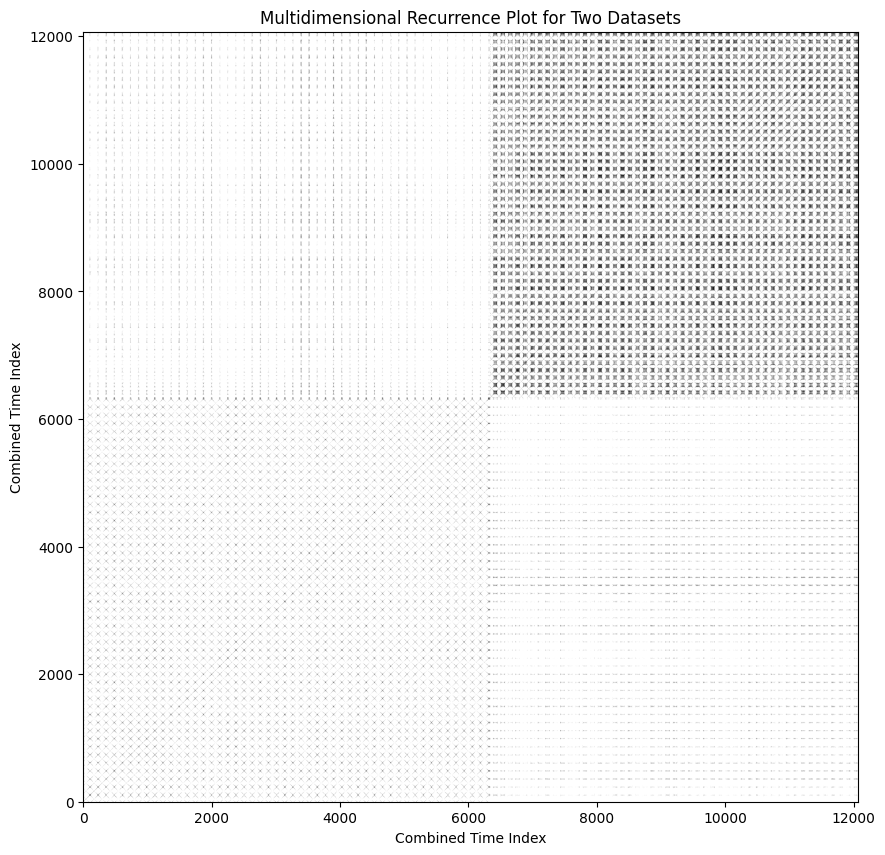

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform

# Load the two CSV files

bad_right_rp_df = create_rp(exclude_cols = ['Time (s)', 'Label'], baseline = 0.6, file_path = '/content/drive/MyDrive/Research/bad_big_circle_right.csv')
good_df = create_rp(exclude_cols = ['Time (s)', 'Label'], baseline = 0.6, file_path = '/content/drive/MyDrive/Research/good.csv')

# Assuming columns F0 to F7 are at positions 1 to 8 in both datasets
sensor_data1 = bad_right_rp_df.iloc[:, 1:9].values  # Data from file1
sensor_data2 = good_df.iloc[:, 1:9].values  # Data from file2

# Concatenate the two datasets row-wise for pairwise distance computation
combined_data = np.vstack([sensor_data1, sensor_data2])

# Compute the pairwise distances between all points
distance_matrix = squareform(pdist(combined_data, 'euclidean'))

# Define a threshold (epsilon)
epsilon = np.percentile(distance_matrix, 5)  # Set threshold to 5th percentile of distances

# Create the recurrence matrix (distance less than epsilon)
recurrence_matrix = (distance_matrix < epsilon).astype(float)

# Plot the recurrence plot
plt.figure(figsize=(10, 10))
plt.imshow(recurrence_matrix, cmap='binary', origin='lower', aspect='auto')
plt.title('Multidimensional Recurrence Plot for Two Datasets')
plt.xlabel('Combined Time Index')
plt.ylabel('Combined Time Index')
plt.show()


In [ ]:
# Example pressure sensor data (replace with your actual data)
pressure_data = np.array([1.0, 1.2, 0.9, 1.1, 1.3, 0.8, 1.0, 1.4])

# Normalize the data
pressure_data = (pressure_data - np.mean(pressure_data)) / np.std(pressure_data)

# Compute the pairwise distances
distance_matrix = squareform(pdist(pressure_data[:, None], 'euclidean'))

# Define a threshold (epsilon)
epsilon = 0.5

# Create the recurrence matrix
recurrence_matrix = (distance_matrix < epsilon).astype(float)

# Plot the recurrence plot
plt.figure(figsize=(6, 6))
plt.imshow(recurrence_matrix, cmap='binary', origin='lower')
plt.title('Recurrence Plot')
plt.xlabel('Time Index')
plt.ylabel('Time Index')
plt.show()
